<a href="https://colab.research.google.com/github/Asapkim/Safra-Intern-Healthcare-project/blob/main/Healthcare_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Medical Insurance Cover Prediction

This project aims at predicting the lkelihood that someone has purchased or is in possesion of a Medical insurance cover based on the various Demographic, and Social-political factors. The prediction is based on the identification of key features that mainly contribute significantly to the assessmesnt of one being in possesion of a Medical Insurance cover.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly as py
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn.metrics import  accuracy_score, confusion_matrix, RocCurveDisplay
from sklearn.decomposition import PCA, SparsePCA
import warnings

## Data Cleaning and Preprocessing

### Data Overview

Our  dataset ``Healthcare Data.csv`` includes  several  columns  capturing  various  aspects  of  healthcare  access  and
utilization:
1. Timestamp: When the data was recorded.
2. Age: Age group of the respondent.
3. Gender: Gender of the respondent.
4. Marital Status: Marital status of the respondent.
5. How many children do you have, if any?: Number of children.
6. Employment Status: Employment status of the respondent.
7. Monthly Household Income: Monthly household income bracket.
8. Have you ever had health insurance?: If the respondent has ever had health insurance.
9. If yes, which insurance cover?: Type of insurance cover.
10. When was the last time you visited a hospital for medical treatment? (In Months):
Time since the last hospital visit.
11. Did  you  have  health  insurance  during  your  last  hospital  visit?:  Health  insurance
status during the last hospital visit.
12. Have you ever had a routine check-up with a doctor or healthcare provider?: If
the respondent has ever had a routine check-up.
13. If yes, what time period (in years) do you stay before having your routine check-
up?: Frequency of routine check-ups.
14. Have you ever had a cancer screening (e.g., mammogram, colonoscopy, etc.)?: If
the respondent has ever had a cancer screening.
15. If  yes,  what  time  period  (in  years)  do  you  stay  before  having  your  Cancer
screening?: Frequency of cancer screenings.
16. GeoCode: Geographical coordinates of the respondent's location.
17. GeoAddress: Address of the respondent

In [ ]:
df = pd.read_csv('Healthcare Data.csv', encoding='latin1')
df =df.drop(['Dirty1', 'Dirty2', 'Timestamp'], axis=1)

# Dictionary mapping old column names to new column names
rename_dict = {
    'Age': 'Patient_Age',
    'Gender': 'Patient_Gender',
    'Marital_status': 'Marital_Status',
    'Children': 'Number_of_Children',
    'Employment_status': 'Employment_Status',
    'Monthly Household Income': 'Monthly_Income',
    'Have you ever had health insurance?': 'Had_Health_Insurance',
    'Insurance': 'Current_Insurance',
    'last_visit': 'Last_Visit',
    'Did you have health insurance during your last hospital visit?': 'Insurance_During_Last_Visit',
    'Have you ever had a routine check-up with a doctor or healthcare provider?': 'Routine_Checkup',
    'If you answered yes to the previous question, what time period (in years) do you stay before having your routine check-up?': 'Checkup_Interval_Years',
    'Have you ever had a cancer screening (e.g. mammogram, colonoscopy, etc.)?': 'Had_Cancer_Screening',
    'If you answered yes to the previous question, what time period (in years) do you stay before having your Cancer screening?': 'Cancer_Screening_Interval_Years',
    'GeoCode': 'Geographical_Code',
    'GeoAddress': 'Geographical_Address'
}

# Rename the columns using the dictionary
df = df.rename(columns=rename_dict)
df.head()

,Patient_Age,Patient_Gender,Marital_Status,Number_of_Children,Employment_Status,Monthly_Income,Had_Health_Insurance,Current_Insurance,Last_Visit,Insurance_During_Last_Visit,Routine_Checkup,Checkup_Interval_Years,Had_Cancer_Screening,Cancer_Screening_Interval_Years,Geographical_Code,Geographical_Address
0,18-30,Male,Single,0,Student,Less than 10000,Yes,AMACO,29.0,No,No,0,No,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+..."
1,18-30,Male,Single,0,Student,10001-20000,No,No Insurance,10.0,No,No,0,No,0,"-0.7274496,37.158912","75F5+5GC, Murang'a, Kenya"
2,18-30,Male,Single,0,Unemployed,Less than 10000,No,No Insurance,1.0,No,No,0,No,0,"-0.7284222,37.1501468","C71, Kenya"
3,18-30,Male,Single,0,Unemployed,Less than 10000,No,No Insurance,11.0,No,No,0,No,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+..."
4,18-30,Male,Single,0,Student,Less than 10000,No,No Insurance,12.0,No,No,0,No,0,"-1.2841,36.8155","Kenyatta Market, PR88+959, Nairobi, Kenya"


In [ ]:
df['Geographical_Code'].fillna('Unknown', inplace=True)
df['Geographical_Address'].fillna('Unknown', inplace=True)
nan_counts = df.isnull().sum()
print("Total NaN values per column:")
print(nan_counts)

Total NaN values per column:
Patient_Age                        0
Patient_Gender                     0
Marital_Status                     0
Number_of_Children                 0
Employment_Status                  0
Monthly_Income                     0
Had_Health_Insurance               0
Current_Insurance                  0
Last_Visit                         0
Insurance_During_Last_Visit        0
Routine_Checkup                    0
Checkup_Interval_Years             0
Had_Cancer_Screening               0
Cancer_Screening_Interval_Years    0
Geographical_Code                  0
Geographical_Address               0
dtype: int64


In [ ]:
# Columns to be one-hot encoded
columns_to_encode = ['Had_Health_Insurance', 'Insurance_During_Last_Visit', 'Routine_Checkup', 'Had_Cancer_Screening']

# Apply one-hot encoding
for column in columns_to_encode:
    df[column] = df[column].apply(lambda x: 1 if x == 'Yes' else 0)

df.dtypes

Patient_Age                         object
Patient_Gender                      object
Marital_Status                      object
Number_of_Children                   int64
Employment_Status                   object
Monthly_Income                      object
Had_Health_Insurance                 int64
Current_Insurance                   object
Last_Visit                         float64
Insurance_During_Last_Visit          int64
Routine_Checkup                      int64
Checkup_Interval_Years               int64
Had_Cancer_Screening                 int64
Cancer_Screening_Interval_Years      int64
Geographical_Code                   object
Geographical_Address                object
dtype: object

## Exploratory Data Analysis

#### 1. Demographic Analysis

To  understand  the  demographic  distribution  (age,  gender,  marital
status) of our respondent

**Impact**: By analyzing demographic data, we can identify which groups are most
in  need  of  healthcare  services.  This  helps  tailor  healthcare  interventions  to
specific  populations,  ensuring  resources  are  directed  where  they  are  most
needed. s

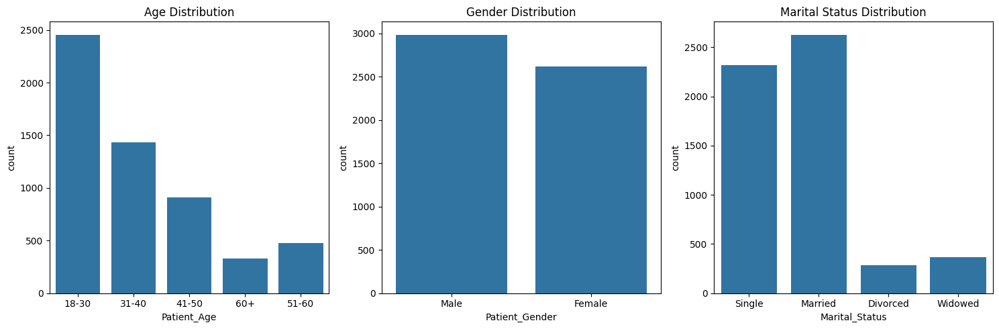

In [ ]:
# Plotting distributions
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Age distribution
sns.countplot(x='Patient_Age', data=df, ax=axs[0])
axs[0].set_title('Age Distribution')

# Gender distribution
sns.countplot(x='Patient_Gender', data=df, ax=axs[1])
axs[1].set_title('Gender Distribution')

# Marital status distribution
sns.countplot(x='Marital_Status', data=df, ax=axs[2])
axs[2].set_title('Marital Status Distribution')

plt.tight_layout()
plt.show()

* **``Patient Age``** - From the analysis we can observe that the majority of the data cosists of the young population aged between (18-30) years and the least count of occurence being the people over the age of 60 (60+)
* **``Patient Gender``** - There are more males than females in the overall dataset

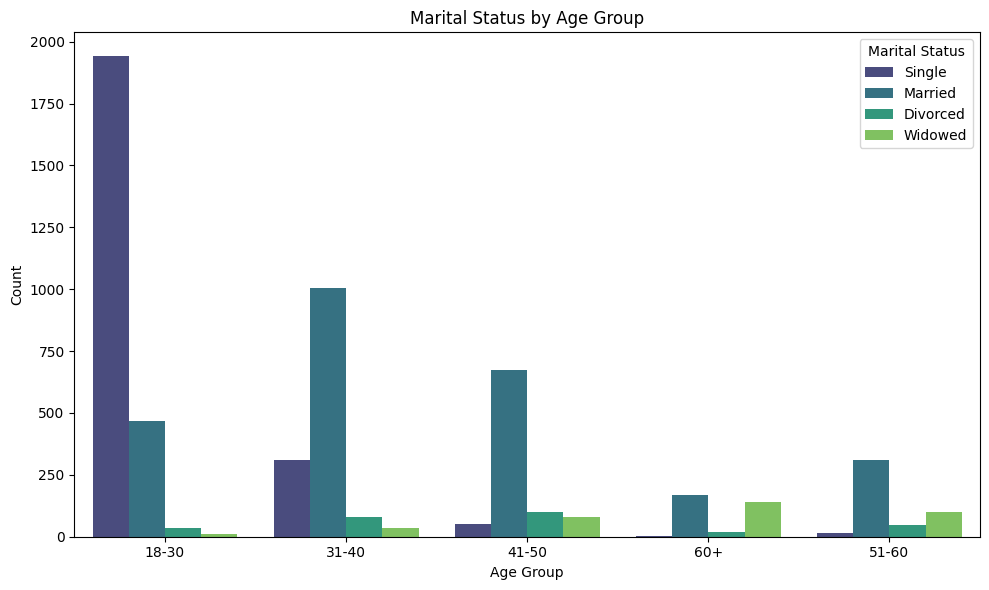

In [ ]:
# Plotting count plot of Marital status and age
plt.figure(figsize=(10, 6))
sns.countplot(x='Patient_Age', hue='Marital_Status', data=df, palette='viridis')
plt.title('Marital Status by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(title='Marital Status')
plt.tight_layout()
plt.show()

* **``Marital Status``** - We can observe that the data consists of individuals who are mostly married with the least occurence of marital status being those who are divorced.

We can get the following insights from the above data plot

1. The majority of individuals in the 18-30 age group are single, which is consistent with the expectation that younger people are more likely to be unmarried.
2. The 31-40 age group has a significant number of married individuals, indicating that this is a common age range for marriage.
3. The 41-50 age group also has a notable number of married individuals, though it appears slightly less than the 31-40 age group. This suggests that many individuals remain married as they age.

Patient_Gender  Female  Male
Patient_Age                 
18-30             1085  1371
31-40              679   753
41-50              485   423
51-60              213   261
60+                153   177


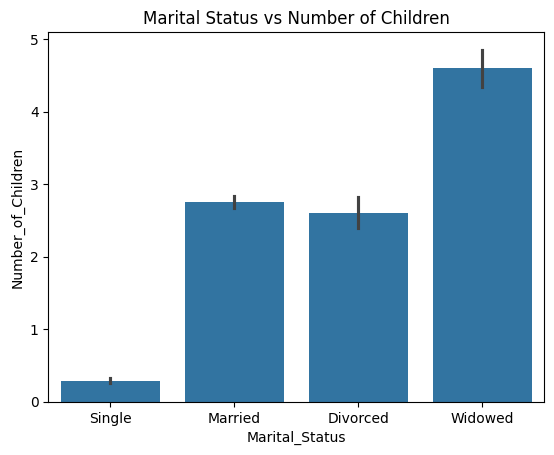

In [ ]:
# Crosstab for Age and Gender
age_gender_crosstab = pd.crosstab(df['Patient_Age'], df['Patient_Gender'])
print(age_gender_crosstab)

# Bar plot for Marital Status and Number of Children
sns.barplot(x='Marital_Status', y='Number_of_Children', data=df)
plt.title('Marital Status vs Number of Children')
plt.show()

* Single individuals have the lowest average number of children. This is expected as single individuals are less likely to have children compared to those who are married or have been married.
* Married individuals have a higher average number of children compared to single individuals. This aligns with the general trend that married couples are more likely to have children.

#### 2. Health Insurance coverage

To determine the prevalence of health insurance coverage and identify
the types of insurance.

**Impact**:  Understanding  insurance  coverage  allows  us  to  gauge  the  financial
protection  available  to  the  population.  This  insight  can  drive  initiatives  to
increase  insurance  uptake,  reducing  the  financial  burden  on  individuals  and
promoting broader access to healthcare services.

C:\Users\Thorne\AppData\Local\Temp\ipykernel_8288\2793734151.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_insurance.values, y=top_insurance.index, palette='viridis')


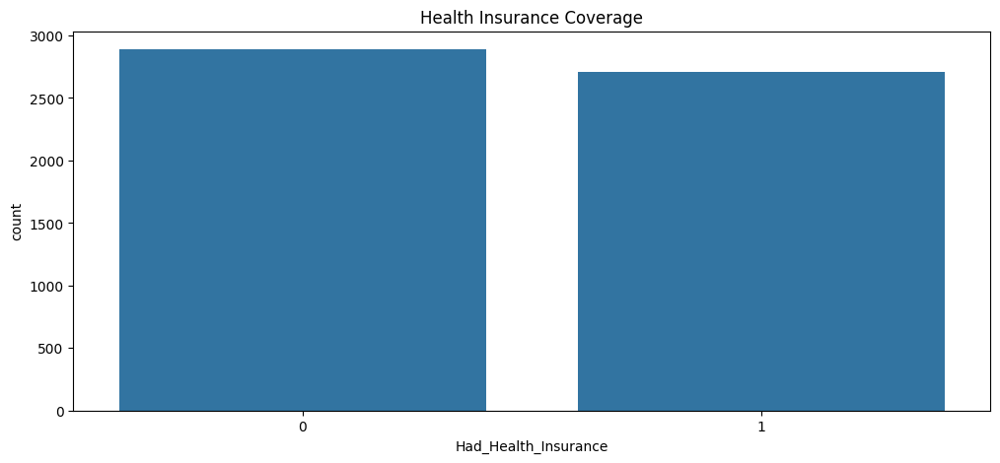

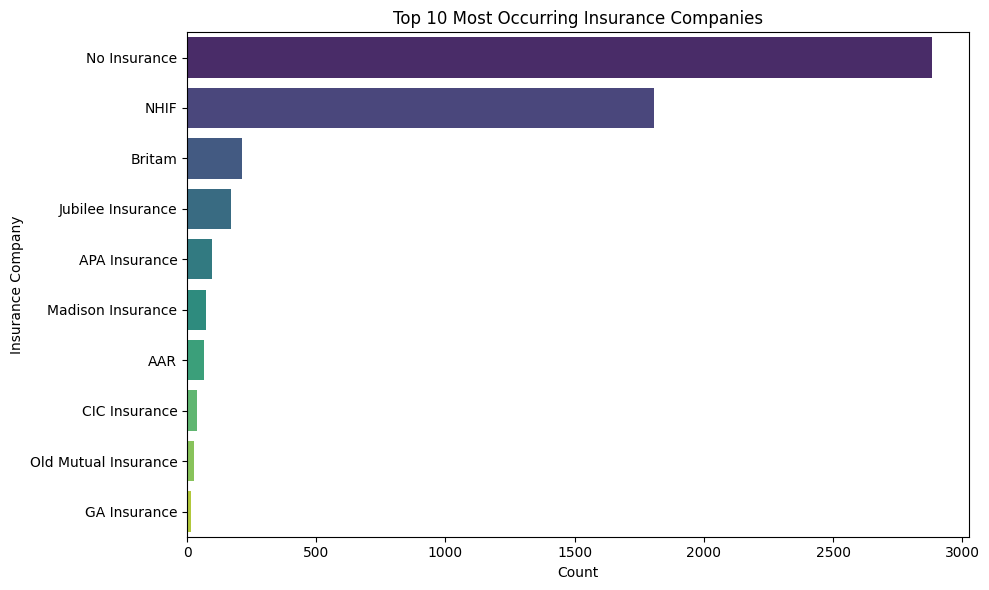

In [ ]:
# Plotting distributions
fig, axs = plt.subplots(1, 1, figsize=(12, 5))

# Health insurance coverage
sns.countplot(x='Had_Health_Insurance', data=df, ax=axs)
axs.set_title('Health Insurance Coverage')

# Plotting the top 10 most occuring types of insurance using seaborn

top_insurance = df['Current_Insurance'].value_counts().head(10)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_insurance.values, y=top_insurance.index, palette='viridis')
plt.title('Top 10 Most Occurring Insurance Companies')
plt.xlabel('Count')
plt.ylabel('Insurance Company')
plt.tight_layout()
plt.show()

**``Insights``**

* **High Rate of Uninsured Individuals**: The most significant insight is that he majority of respondents have no insurance. This suggests that there is a large portion of the population without health insurance coverage, which may indicate barriers to accessing insurance or a lack of awareness about the importance of health insurance.
* **Prevalence of NHIF**: The National Hospital Insurance Fund (NHIF) is the second most common, which indicates that it is the primary source of health insurance for those who are insured. NHIF is likely the most accessible and affordable option for many individuals.
* **Other Insurance Companies**: The other insurance companies listed, such as Britam, Jubilee Insurance, APA Insurance, Madison Insurance, AAR, CIC Insurance, Old Mutual Insurance, and GA Insurance, have significantly fewer counts compared to NHIF. This could imply that these companies are either less popular, more expensive, or offer services that are not as well-known or accessible.
* **Concentration of Insurance Coverage**: The steep drop-off in counts from NHIF to the other companies suggests that insurance coverage is highly concentrated in a few providers, with NHIF being the dominant player. This might also reflect market dynamics and the reach of these insurance providers.

**``Implications``**
* **Policy Focus on Increasing Insurance Coverage**: Given the high number of uninsured individuals, policymakers and stakeholders might need to focus on strategies to increase health insurance coverage. This could include public awareness campaigns, subsidies, or policy changes to make insurance more affordable and accessible.
* **Strengthening NHIF**: Since NHIF is the most common insurance provider, efforts to strengthen and expand NHIF services could have a significant impact on improving health insurance coverage and healthcare access.
* **Diversifying Insurance Options**: Encouraging the growth and reach of other insurance companies could provide more options for individuals, potentially making insurance more competitive and affordable.


#### 3. Healthcare Utilization
To  analyze  how  frequently  individuals  visit  hospitals  and  undergo
routine check-ups

**Impact**:  Insights  into  healthcare  utilization  reveal  potential  gaps  in  access  to
medical  services.  This  can  guide  policy  changes  and  healthcare  infrastructure
improvements to ensure timely and adequate medical care for all segments of
the population..

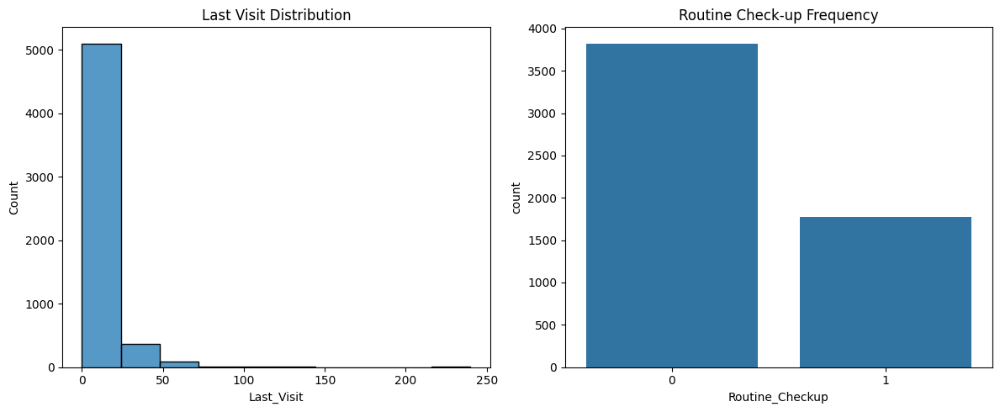

In [ ]:
# Plotting distributions
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Last visit distribution
sns.histplot(df['Last_Visit'], bins=10, ax=axs[0])
axs[0].set_title('Last Visit Distribution')

# Routine check-up frequency
sns.countplot(x='Routine_Checkup', data=df, ax=axs[1])
axs[1].set_title('Routine Check-up Frequency')

plt.tight_layout()
plt.show()

From the observation on the plot, we can see that a high number of population do not have routine check-ups.

#### Preventive Health Measures

To  examine  the  prevalence  and  frequency  of  preventive  health
measures like routine check-ups and cancer screening

**Impact**:  Identifying  barriers  to  preventive  healthcare  helps  promote  early
detection and treatment  of diseases. This can lead to reduced healthcare  costs
and improved health outcomes through timely interventions.s

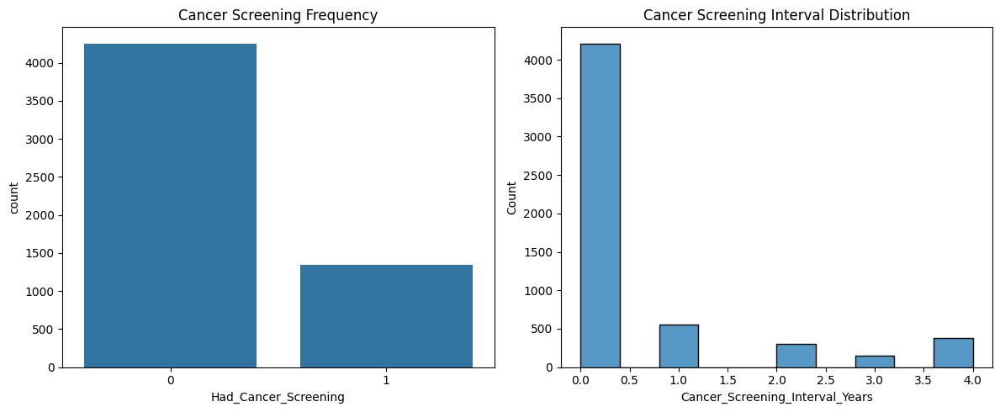

In [ ]:
# Plotting distributions
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Cancer screening frequency
sns.countplot(x='Had_Cancer_Screening', data=df, ax=axs[0])
axs[0].set_title('Cancer Screening Frequency')

# Cancer screening interval
sns.histplot(df['Cancer_Screening_Interval_Years'], bins=10, ax=axs[1])
axs[1].set_title('Cancer Screening Interval Distribution')

plt.tight_layout()
plt.show()

#### Geographical Analysis

To map healthcare utilization and insurance coverage across different
geographical regions

**Impact**:  Geographical  analysis  can  pinpoint  regions  with  poor  healthcare
access,  enabling  targeted  improvements.  This  ensures  equitable  healthcare
distribution and helps address regional disparities in health outcomes. .

In [ ]:
pip install folium.clear()

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement folium.clear (from versions: none)
ERROR: No matching distribution found for folium.clear


In [ ]:
# Plot the geographical distribution of respondents
import folium
from folium.plugins import MarkerCluster

# Create a map
map_kenya = folium.Map(location=[0.0236, 37.9062], zoom_start=6)

# Add points to the map
marker_cluster = MarkerCluster().add_to(map_kenya)

for idx, row in df.iterrows():
    # Skip rows where Geographical_Code is 'unknown'
    if row['Geographical_Code'] == 'unknown':
        continue

    # Split the Geographical_Code into latitude and longitude
    geo_code = row['Geographical_Code'].split(',')

    # Ensure that the Geographical_Code has both latitude and longitude
    if len(geo_code) == 2:
        try:
            latitude = float(geo_code[0])
            longitude = float(geo_code[1])
            folium.Marker([latitude, longitude], popup=row['Geographical_Address']).add_to(marker_cluster)
        except ValueError:
            # Handle the case where latitude or longitude is not a valid float
            pass  # Skip this row silently
    # No need to handle else condition for invalid Geographical_Code here

# Display the map
map_kenya

#### Socioeconomic Factors

To  explore  the  relationship  between  socioeconomic  status  (income,
employment) and healthcare outcomes

**Impact**: Understanding the link between socioeconomic factors and healthcare
access  can  highlight  the  need  for  economic  and  social  policies  that  support
health equity. This can lead to more inclusive healthcare strategies that address
the needs of economically disadvantaged populations...

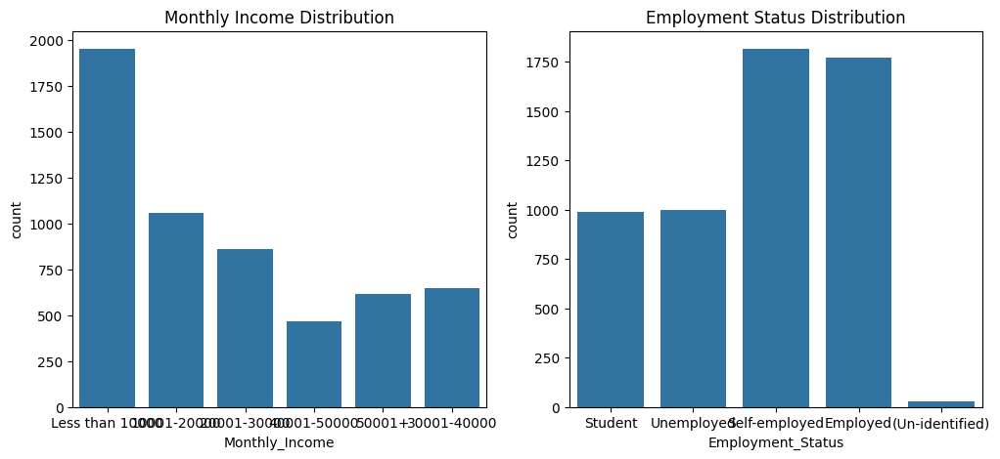

In [ ]:
# Plotting distributions
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Monthly income distribution
sns.countplot(x='Monthly_Income', data=df, ax=axs[0])
axs[0].set_title('Monthly Income Distribution')

# Employment status distribution
sns.countplot(x='Employment_Status', data=df, ax=axs[1])
axs[1].set_title('Employment Status Distribution')


plt.show()

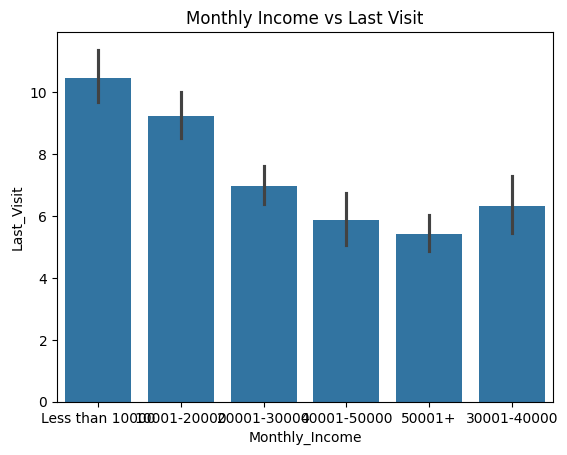

In [ ]:
# Bar plot for Monthly Income and Last Visit
sns.barplot(x='Monthly_Income', y='Last_Visit', data=df)
plt.title('Monthly Income vs Last Visit')
plt.show()

In [ ]:
## Encoding
df.describe(include="object")

,Patient_Age,Patient_Gender,Marital_Status,Employment_Status,Monthly_Income,Current_Insurance,Geographical_Code,Geographical_Address
count,5600,5600,5600,5600,5600,5600,5600,5600
unique,5,2,4,5,6,58,2243,1482
top,18-30,Male,Married,Self-employed,Less than 10000,No Insurance,Unknown,Unknown
freq,2456,2985,2628,1816,1953,2882,2077,2080


In [ ]:
df['Patient_Gender']=df['Patient_Gender'].replace(["Male","Female"],[1,0])

#lets convert Insurer column to numeric type
df['Current_Insurance'] = df['Current_Insurance'].astype('category')
df['Current_Insurance'] = df['Current_Insurance'].cat.codes
df.head()

,Patient_Age,Patient_Gender,Marital_Status,Number_of_Children,Employment_Status,Monthly_Income,Had_Health_Insurance,Current_Insurance,Last_Visit,Insurance_During_Last_Visit,Routine_Checkup,Checkup_Interval_Years,Had_Cancer_Screening,Cancer_Screening_Interval_Years,Geographical_Code,Geographical_Address
0,18-30,1,Single,0,Student,Less than 10000,1,3,29.0,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+..."
1,18-30,1,Single,0,Student,10001-20000,0,46,10.0,0,0,0,0,0,"-0.7274496,37.158912","75F5+5GC, Murang'a, Kenya"
2,18-30,1,Single,0,Unemployed,Less than 10000,0,46,1.0,0,0,0,0,0,"-0.7284222,37.1501468","C71, Kenya"
3,18-30,1,Single,0,Unemployed,Less than 10000,0,46,11.0,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+..."
4,18-30,1,Single,0,Student,Less than 10000,0,46,12.0,0,0,0,0,0,"-1.2841,36.8155","Kenyatta Market, PR88+959, Nairobi, Kenya"


In [ ]:
print(df["Last_Visit"].max())
print(df["Last_Visit"].min())

240.0
0.0


In [ ]:
df["Last_Visit(Years)"] = df["Last_Visit"]/12
df = df.drop(columns="Last_Visit")
print(df["Last_Visit(Years)"].max())

20.0


In [ ]:
df.head()

,Patient_Age,Patient_Gender,Marital_Status,Number_of_Children,Employment_Status,Monthly_Income,Had_Health_Insurance,Current_Insurance,Insurance_During_Last_Visit,Routine_Checkup,Checkup_Interval_Years,Had_Cancer_Screening,Cancer_Screening_Interval_Years,Geographical_Code,Geographical_Address,Last_Visit(Years)
0,18-30,1,Single,0,Student,Less than 10000,1,3,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",2.416667
1,18-30,1,Single,0,Student,10001-20000,0,46,0,0,0,0,0,"-0.7274496,37.158912","75F5+5GC, Murang'a, Kenya",0.833333
2,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-0.7284222,37.1501468","C71, Kenya",0.083333
3,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",0.916667
4,18-30,1,Single,0,Student,Less than 10000,0,46,0,0,0,0,0,"-1.2841,36.8155","Kenyatta Market, PR88+959, Nairobi, Kenya",1.000000


In [ ]:
df["Marital_Status"].unique()

array(['Single', 'Married', 'Divorced', 'Widowed'], dtype=object)

In [ ]:
df["Employment_Status"].unique()
df["Monthly_Income"].unique()

array(['Less than 10000', '10001-20000', '20001-30000', '40001-50000',
       '50001+', '30001-40000'], dtype=object)

In [ ]:
marital_mapping  = {
    'Single': 0,
    'Married': 1,
    'Divorced': 2,
    'Widowed': 3
}

age_mapping = {
    '18-30': 24,
    '31-40': 35,
    '41-50': 45,
    '51-60': 55,
    '60+': 65
}

employment_mapping = {
    'Employed': 0,
    'Unemployed': 1,
    'Self-employed': 2,
    '(Un-identified)': 3,
    'Student': 4
}

### Unsupervised Learning

#### K-Means clustering

In [ ]:
df.head()

,Patient_Age,Patient_Gender,Marital_Status,Number_of_Children,Employment_Status,Monthly_Income,Had_Health_Insurance,Current_Insurance,Insurance_During_Last_Visit,Routine_Checkup,Checkup_Interval_Years,Had_Cancer_Screening,Cancer_Screening_Interval_Years,Geographical_Code,Geographical_Address,Last_Visit(Years)
0,18-30,1,Single,0,Student,Less than 10000,1,3,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",2.416667
1,18-30,1,Single,0,Student,10001-20000,0,46,0,0,0,0,0,"-0.7274496,37.158912","75F5+5GC, Murang'a, Kenya",0.833333
2,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-0.7284222,37.1501468","C71, Kenya",0.083333
3,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",0.916667
4,18-30,1,Single,0,Student,Less than 10000,0,46,0,0,0,0,0,"-1.2841,36.8155","Kenyatta Market, PR88+959, Nairobi, Kenya",1.000000


In [ ]:
df1 = df.copy()
from sklearn.preprocessing import LabelEncoder
# Label encoding
label_encoder = LabelEncoder()
df1['Patient_age_encoded'] = label_encoder.fit_transform(df1['Patient_Age'])
df1.head()

,Patient_Age,Patient_Gender,Marital_Status,Number_of_Children,Employment_Status,Monthly_Income,Had_Health_Insurance,Current_Insurance,Insurance_During_Last_Visit,Routine_Checkup,Checkup_Interval_Years,Had_Cancer_Screening,Cancer_Screening_Interval_Years,Geographical_Code,Geographical_Address,Last_Visit(Years),Patient_age_encoded
0,18-30,1,Single,0,Student,Less than 10000,1,3,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",2.416667,0
1,18-30,1,Single,0,Student,10001-20000,0,46,0,0,0,0,0,"-0.7274496,37.158912","75F5+5GC, Murang'a, Kenya",0.833333,0
2,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-0.7284222,37.1501468","C71, Kenya",0.083333,0
3,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",0.916667,0
4,18-30,1,Single,0,Student,Less than 10000,0,46,0,0,0,0,0,"-1.2841,36.8155","Kenyatta Market, PR88+959, Nairobi, Kenya",1.000000,0


In [ ]:
x = df1.loc[:,["Patient_age_encoded","Number_of_Children","Had_Health_Insurance"]]

C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\

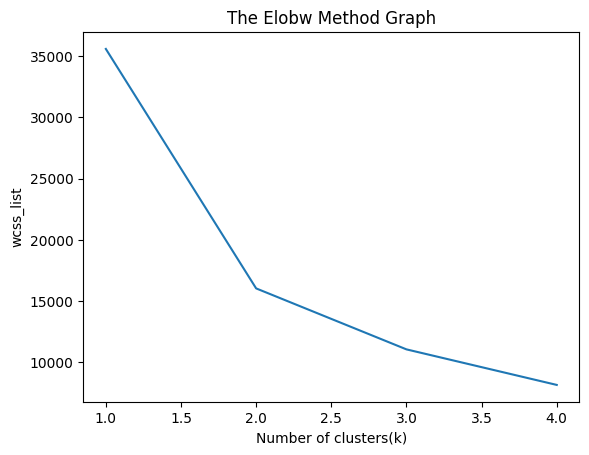

In [ ]:
from sklearn.cluster import KMeans
wcss =[]
for i in range(1,5):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 5), wcss)
plt.title('The Elobw Method Graph')
plt.xlabel('Number of clusters(k)')
plt.ylabel('wcss_list')
plt.show()

C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


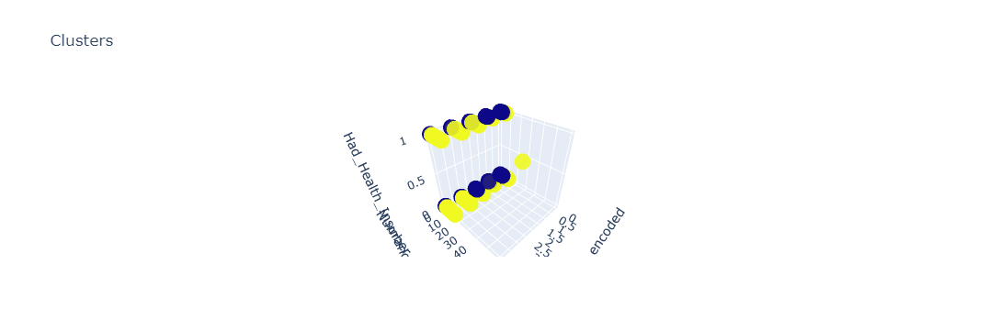

In [ ]:
kmeans = KMeans(n_clusters=2, init = "k-means++", random_state = 42)
y_predict=kmeans.fit_predict(x)

labels = kmeans.labels_
centroids = kmeans.cluster_centers_

#Create a 3d plot to view the data sepparation made by Kmeans
trace1 = go.Scatter3d(
    x= x['Patient_age_encoded'],
    y= x['Number_of_Children'],
    z= x['Had_Health_Insurance'],
    mode='markers',
     marker=dict(
        color = labels,
        size= 10,
        line=dict(
            color= labels,
        ),
        opacity = 0.9
     )
)
layout = go.Layout(
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Patient_age_encoded'),
            yaxis = dict(title  = 'Number_of_Children'),
            zaxis = dict(title  = 'Had_Health_Insurance')
        )
)
fig = go.Figure(data=trace1, layout=layout)
py.offline.iplot(fig)

#### Supervised Learning

In [ ]:
from sklearn.impute import SimpleImputer
# Feature columns
feature_cols = ['Patient_Age', 'Patient_Gender', 'Marital_Status', 'Number_of_Children', 'Employment_Status', 'Monthly_Income', 'Last_Visit(Years)', 'Geographical_Code']
target_col = ['Had_Health_Insurance']
# Define numerical and categorical columns
numeric_features = ['Number_of_Children', 'Last_Visit(Years)']
categorical_features = ['Patient_Age', 'Patient_Gender', 'Marital_Status', 'Employment_Status', 'Monthly_Income']

# Define preprocessing pipelines
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing pipelines
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

In [ ]:
# Splitting the data
X = df[feature_cols]
y = df[target_col]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
print(X)

     Patient_Age  Patient_Gender Marital_Status  Number_of_Children  \
0          18-30               1         Single                   0   
1          18-30               1         Single                   0   
2          18-30               1         Single                   0   
3          18-30               1         Single                   0   
4          18-30               1         Single                   0   
...          ...             ...            ...                 ...   
5595       18-30               1         Single                   0   
5596       18-30               1         Single                   0   
5597       18-30               0         Single                   0   
5598       18-30               1         Single                   0   
5599       41-50               0        Married                   1   

     Employment_Status   Monthly_Income  Last_Visit(Years)  \
0              Student  Less than 10000           2.416667   
1              Student 

In [ ]:
# Fit and transform the training data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [ ]:
X_train[:5], y_train[:5]  # Display first 5 rows of preprocessed features and targets

(<5x24 sparse matrix of type '<class 'numpy.float64'>'
 	with 35 stored elements in Compressed Sparse Row format>,
       Had_Health_Insurance
 898                      1
 428                      1
 4711                     0
 1504                     0
 1513                     1)

In [ ]:
# Logistic Regression
logreg = LogisticRegression(random_state=42)
logreg.fit(X_train, y_train)
logreg_pred = logreg.predict(X_test)
logreg_acc = accuracy_score(y_test, logreg_pred)
print(logreg_acc)

0.6964285714285714


C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:1183: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [ ]:
# Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
rf_acc = accuracy_score(y_test, rf_pred)
print(rf_acc)

C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



0.6776785714285715


In [ ]:
# SVM
svm = SVC(random_state=42)
svm.fit(X_train, y_train)
svm_pred = svm.predict(X_test)
svm_acc = accuracy_score(y_test, svm_pred)
print(svm_acc)

C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:1183: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.6973214285714285


In [ ]:
# Gradient Boosting
gb = GradientBoostingClassifier(random_state=42)
gb.fit(X_train, y_train)
gb_pred = gb.predict(X_test)
gb_acc = accuracy_score(y_test, gb_pred)
print(gb_acc)

C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\ensemble\_gb.py:424: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.7008928571428571


In [ ]:
# K-Means Clustering
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_train)
kmeans_pred = kmeans.predict(X_test)

C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
# Voting Classifier (Ensemble Method)
ensemble = VotingClassifier(
    estimators=[('logreg', logreg), ('rf', rf), ('svm', svm), ('gb', gb)],
    voting='hard'
)

ensemble.fit(X_train, y_train)
ensemble_pred = ensemble.predict(X_test)
ensemble_acc = accuracy_score(y_test, ensemble_pred)
print(ensemble_acc)


C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Thorne\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.7035714285714286


In [ ]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Function to plot ROC Curve
def plot_roc_curve(model, X_test, y_test, title):
    RocCurveDisplay.from_estimator(model, X_test, y_test)
    plt.title(title)
    plt.show()

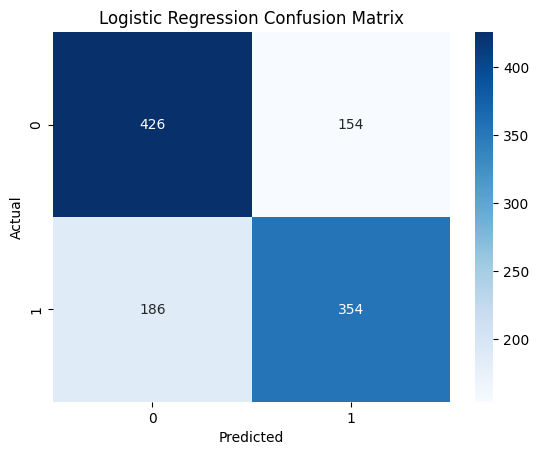

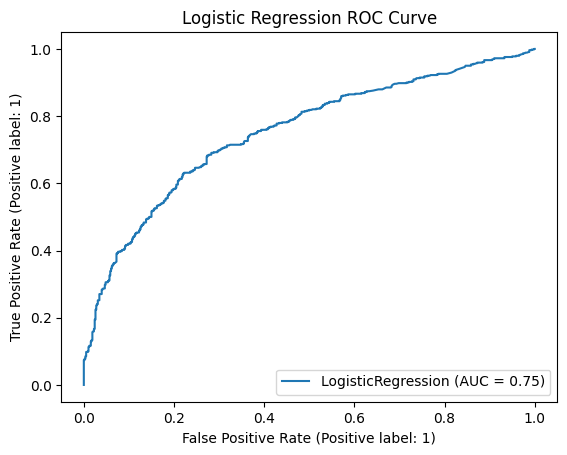

In [ ]:
# Logistic Regression
plot_confusion_matrix(y_test, logreg_pred, 'Logistic Regression Confusion Matrix')
plot_roc_curve(logreg, X_test, y_test, 'Logistic Regression ROC Curve')

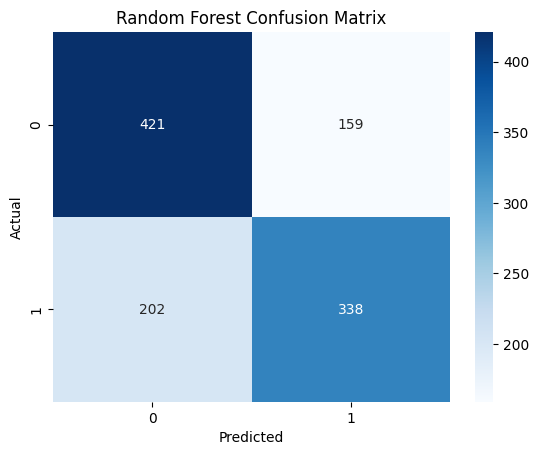

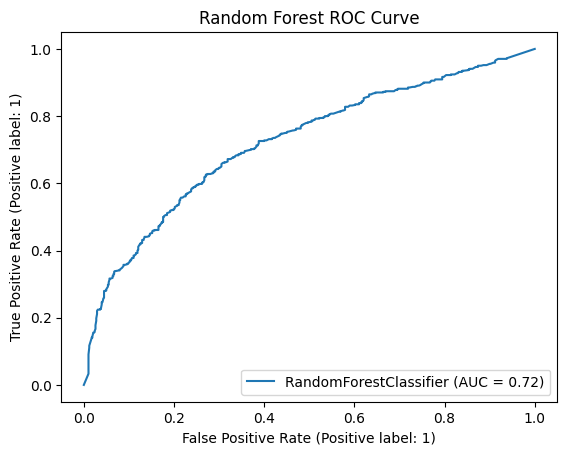

In [ ]:
# Random Forest
plot_confusion_matrix(y_test, rf_pred, 'Random Forest Confusion Matrix')
plot_roc_curve(rf, X_test, y_test, 'Random Forest ROC Curve')

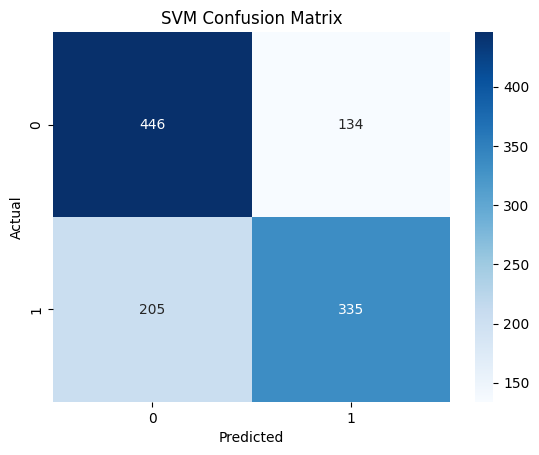

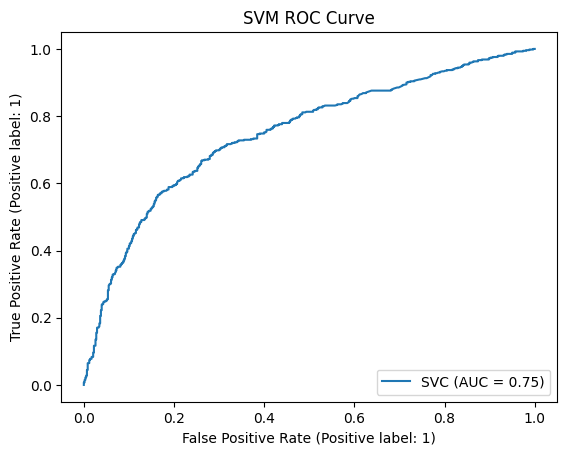

In [ ]:
# SVM
plot_confusion_matrix(y_test, svm_pred, 'SVM Confusion Matrix')
plot_roc_curve(svm, X_test, y_test, 'SVM ROC Curve')

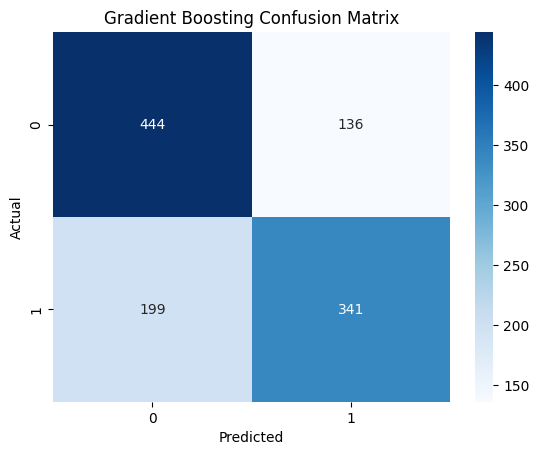

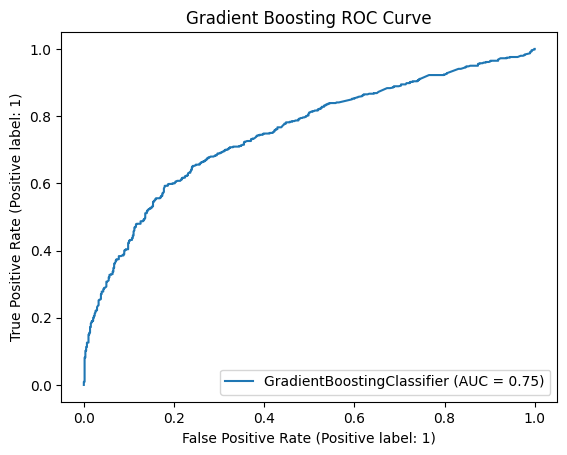

In [ ]:
# Gradient Boosting
plot_confusion_matrix(y_test, gb_pred, 'Gradient Boosting Confusion Matrix')
plot_roc_curve(gb, X_test, y_test, 'Gradient Boosting ROC Curve')

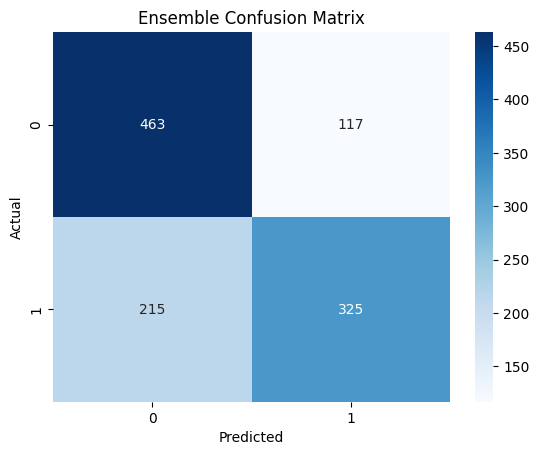

In [ ]:
# Ensemble
plot_confusion_matrix(y_test, ensemble_pred, 'Ensemble Confusion Matrix')
# plot_roc_curve(ensemble, X_test, y_test, 'Ensemble ROC Curve')

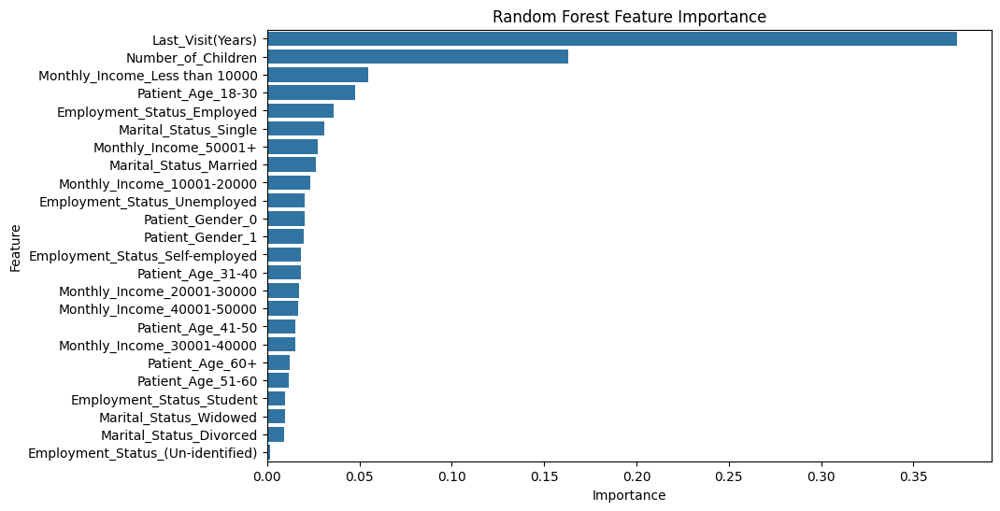

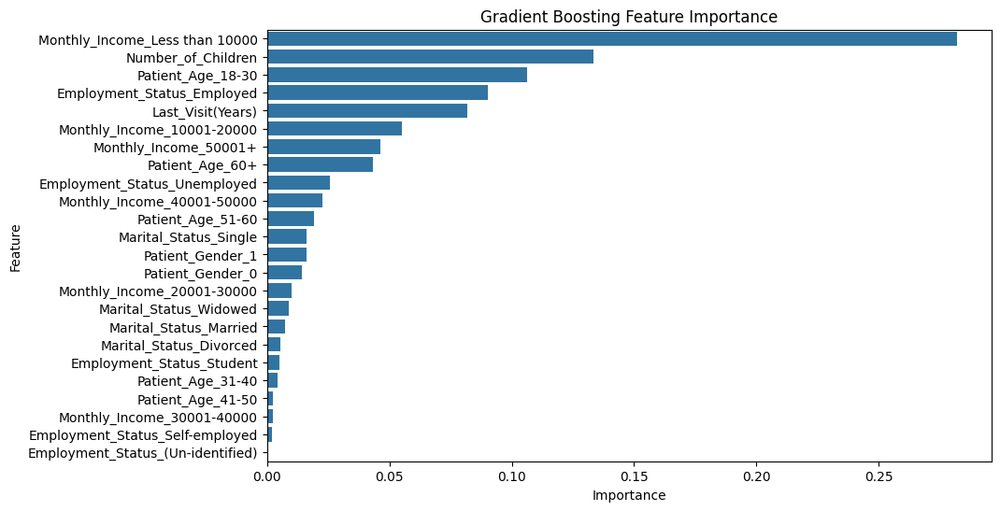

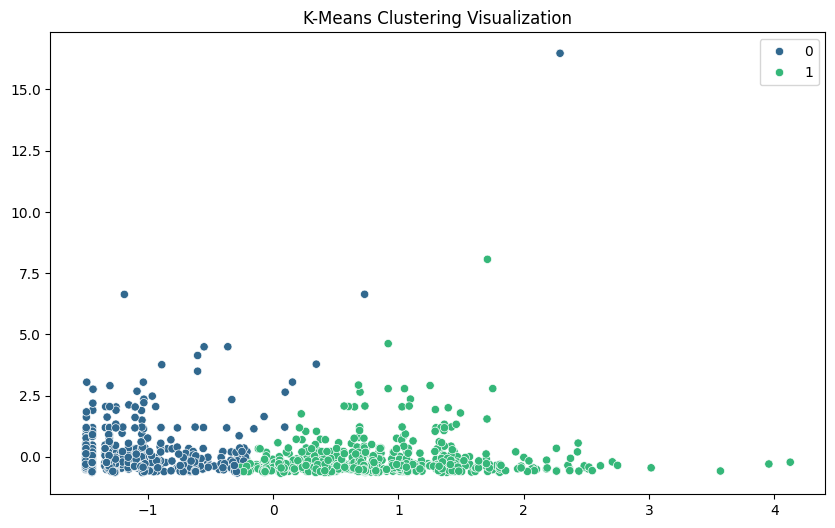

(0.6964285714285714,
 0.6776785714285715,
 0.6973214285714285,
 0.7008928571428571,
 0.7035714285714286)

In [ ]:
# Function to plot feature importance
def plot_feature_importance(model, title, preprocessor, categorical_features, numeric_features):
    feature_importances = model.feature_importances_

    # Get feature names from preprocessor
    categorical_features_names = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features)
    numeric_features_names = numeric_features
    features = list(numeric_features_names) + list(categorical_features_names)

    importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=importance_df)
    plt.title(title)
    plt.show()

# Random Forest Feature Importance
plot_feature_importance(rf, 'Random Forest Feature Importance', preprocessor, categorical_features, numeric_features)

# Gradient Boosting Feature Importance
plot_feature_importance(gb, 'Gradient Boosting Feature Importance', preprocessor, categorical_features, numeric_features)

# Reduce dimensions to 2D for visualization
sparse_pca = SparsePCA(n_components=2)
X_pca = sparse_pca.fit_transform(X_test.toarray())

# Plot clusters
def plot_clusters(X, labels, title):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis')
    plt.title(title)
    plt.show()

plot_clusters(X_pca, kmeans_pred, 'K-Means Clustering Visualization')

# Display the accuracies of the models
logreg_acc, rf_acc, svm_acc, gb_acc, ensemble_acc


#### Feature Engineering

In [ ]:
df.head()

,Patient_Age,Patient_Gender,Marital_Status,Number_of_Children,Employment_Status,Monthly_Income,Had_Health_Insurance,Current_Insurance,Insurance_During_Last_Visit,Routine_Checkup,Checkup_Interval_Years,Had_Cancer_Screening,Cancer_Screening_Interval_Years,Geographical_Code,Geographical_Address,Last_Visit(Years)
0,18-30,1,Single,0,Student,Less than 10000,1,3,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",2.416667
1,18-30,1,Single,0,Student,10001-20000,0,46,0,0,0,0,0,"-0.7274496,37.158912","75F5+5GC, Murang'a, Kenya",0.833333
2,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-0.7284222,37.1501468","C71, Kenya",0.083333
3,18-30,1,Single,0,Unemployed,Less than 10000,0,46,0,0,0,0,0,"-1.2852333,36.8556432","Mvuma Nyuki Street, Off Ole Sinoni Road, PV74+...",0.916667
4,18-30,1,Single,0,Student,Less than 10000,0,46,0,0,0,0,0,"-1.2841,36.8155","Kenyatta Market, PR88+959, Nairobi, Kenya",1.000000


In [ ]:
dumies=pd.get_dummies(df[['Patient_Age','Marital_Status','Employment_Status','Monthly_Income',
                  'Checkup_Interval_Years',
                  'Cancer_Screening_Interval_Years']])

df = pd.concat([df,dumies],axis=1)


df = df.drop(['Patient_Age','Marital_Status','Employment_Status','Monthly_Income',
                  'Checkup_Interval_Years',
                  'Cancer_Screening_Interval_Years'],axis ="columns")

In [ ]:
df = df.drop(columns = ["Geographical_Code", "Geographical_Address"])

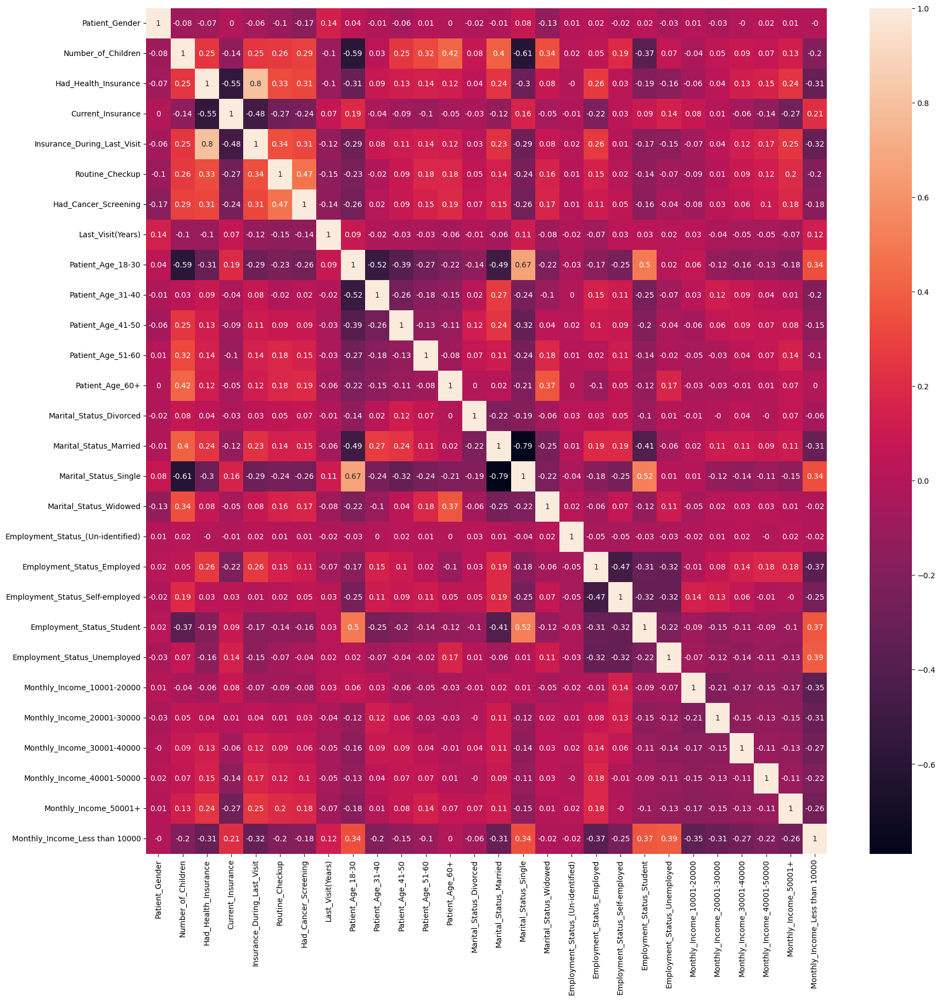

In [ ]:
warnings.filterwarnings("ignore")
plt.figure(figsize=(20,20))
plot = sns.heatmap( data =df.corr().round(2), annot = True )

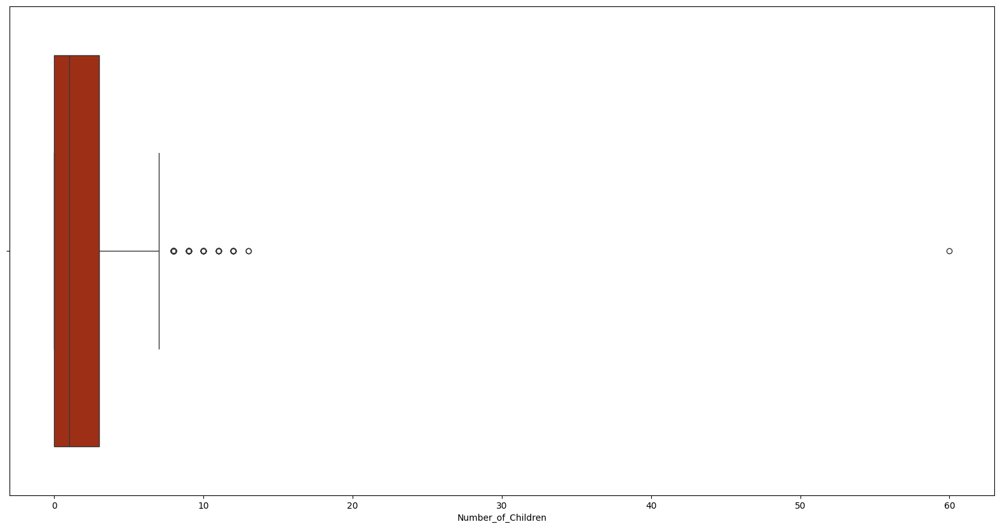

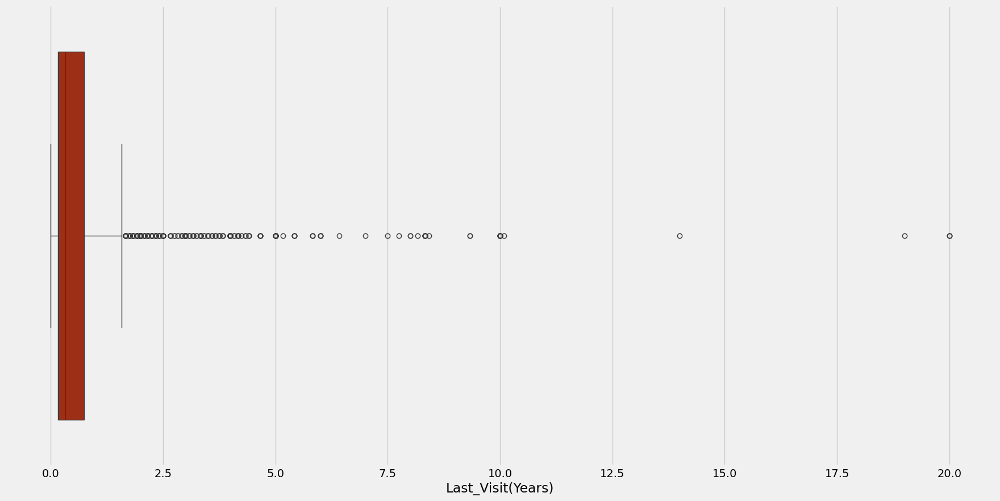

In [ ]:
#Lets identify some outliers
for i in ['Number_of_Children','Last_Visit(Years)']:
    plt.figure(figsize=(20,10))
    sns.boxplot(data= df,x=i,palette='gnuplot')
    plt.style.use("fivethirtyeight")
    plt.show()

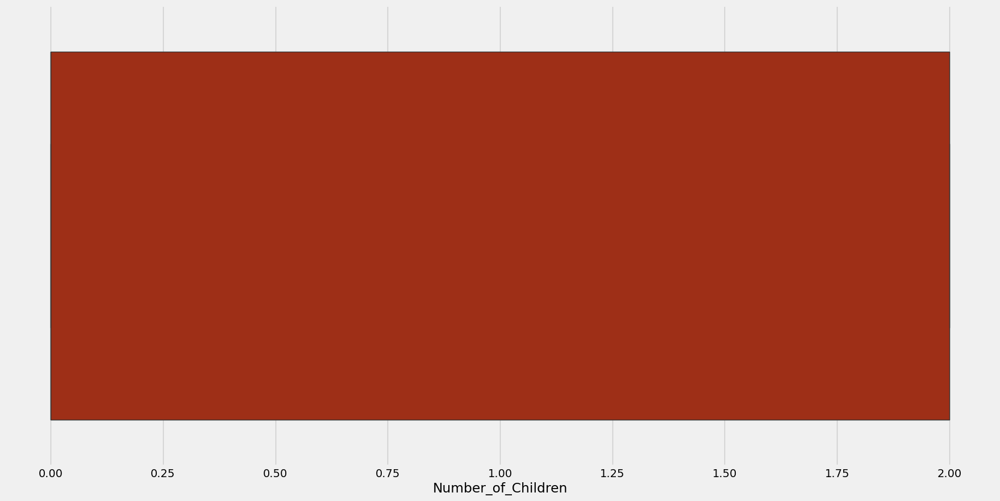

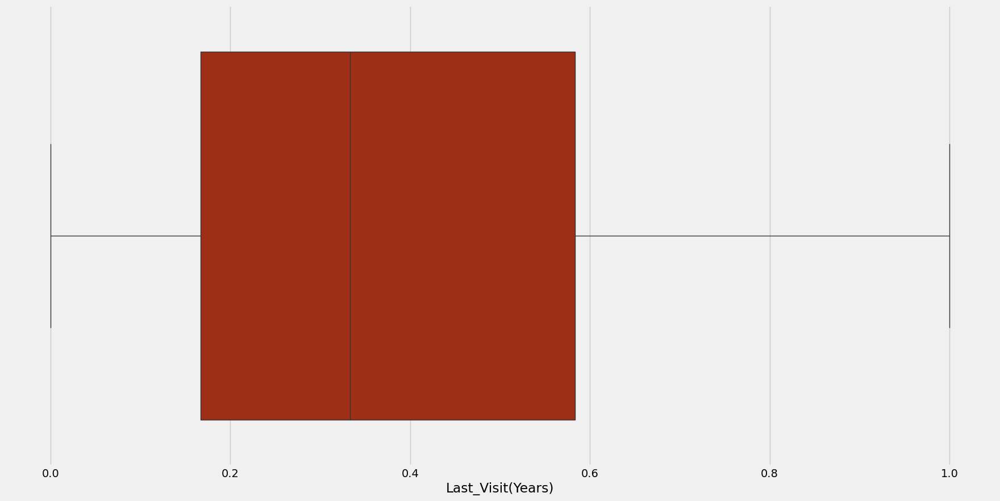

In [ ]:
threshold = 2.5
th2 = 1
df = df.loc[df['Number_of_Children'] <= threshold]
df = df.loc[df['Last_Visit(Years)'] <= th2]


#Lets identify some outliers
for i in df[['Number_of_Children','Last_Visit(Years)']]:
    plt.figure(figsize=(20,10))
    sns.boxplot(data= df,x=i,palette='gnuplot')
    plt.style.use("fivethirtyeight")
    plt.show()

In [ ]:
df.head()

,Patient_Gender,Number_of_Children,Had_Health_Insurance,Current_Insurance,Insurance_During_Last_Visit,Routine_Checkup,Had_Cancer_Screening,Last_Visit(Years),Patient_Age_18-30,Patient_Age_31-40,...,Employment_Status_Employed,Employment_Status_Self-employed,Employment_Status_Student,Employment_Status_Unemployed,Monthly_Income_10001-20000,Monthly_Income_20001-30000,Monthly_Income_30001-40000,Monthly_Income_40001-50000,Monthly_Income_50001+,Monthly_Income_Less than 10000
1,1,0,0,46,0,0,0,0.833333,True,False,...,False,False,True,False,True,False,False,False,False,False
2,1,0,0,46,0,0,0,0.083333,True,False,...,False,False,False,True,False,False,False,False,False,True
3,1,0,0,46,0,0,0,0.916667,True,False,...,False,False,False,True,False,False,False,False,False,True
4,1,0,0,46,0,0,0,1.000000,True,False,...,False,False,True,False,False,False,False,False,False,True
6,1,0,0,46,0,0,0,0.083333,True,False,...,False,False,True,False,False,False,False,False,False,True


In [ ]:
df = df.drop(columns = ["Current_Insurance"])
df.head()

,Patient_Gender,Number_of_Children,Had_Health_Insurance,Insurance_During_Last_Visit,Routine_Checkup,Had_Cancer_Screening,Last_Visit(Years),Patient_Age_18-30,Patient_Age_31-40,Patient_Age_41-50,...,Employment_Status_Employed,Employment_Status_Self-employed,Employment_Status_Student,Employment_Status_Unemployed,Monthly_Income_10001-20000,Monthly_Income_20001-30000,Monthly_Income_30001-40000,Monthly_Income_40001-50000,Monthly_Income_50001+,Monthly_Income_Less than 10000
1,1,0,0,0,0,0,0.833333,True,False,False,...,False,False,True,False,True,False,False,False,False,False
2,1,0,0,0,0,0,0.083333,True,False,False,...,False,False,False,True,False,False,False,False,False,True
3,1,0,0,0,0,0,0.916667,True,False,False,...,False,False,False,True,False,False,False,False,False,True
4,1,0,0,0,0,0,1.000000,True,False,False,...,False,False,True,False,False,False,False,False,False,True
6,1,0,0,0,0,0,0.083333,True,False,False,...,False,False,True,False,False,False,False,False,False,True


### Machine learning

The machine learning models below are trying to identify whether a patient or person in general has an insurace cover or not based on the feature columns to be identified.

The ``accuracy`` of each model determines how well the model is able to calculate the ratio of correctly predicted instances to the total number of instances in the dataset

#### Logistic Regression

First, Lets create a function to plot the confusion matrix and ROC Cuve plots.

In [ ]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Function to plot ROC Curve
def plot_roc_curve(model, X_test, y_test, title):
    RocCurveDisplay.from_estimator(model, X_test, y_test)
    plt.title(title)
    plt.show()

In [ ]:
# Assuming df is your DataFrame and X and y are your features and target
feature_cols = [
    'Patient_Gender', 'Number_of_Children','Insurance_During_Last_Visit',
    'Routine_Checkup', 'Had_Cancer_Screening', 'Last_Visit(Years)',
    'Patient_Age_18-30', 'Patient_Age_31-40', 'Patient_Age_41-50', 'Patient_Age_51-60', 'Patient_Age_60+',
    'Marital_Status_Divorced', 'Marital_Status_Married', 'Marital_Status_Single', 'Marital_Status_Widowed',
    'Employment_Status_(Un-identified)', 'Employment_Status_Employed', 'Employment_Status_Self-employed',
    'Employment_Status_Student', 'Employment_Status_Unemployed',
    'Monthly_Income_10001-20000', 'Monthly_Income_20001-30000', 'Monthly_Income_30001-40000',
    'Monthly_Income_40001-50000', 'Monthly_Income_50001+', 'Monthly_Income_Less than 10000'
]

In [ ]:
df.dtypes

Patient_Gender                         int64
Number_of_Children                     int64
Had_Health_Insurance                   int64
Insurance_During_Last_Visit            int64
Routine_Checkup                        int64
Had_Cancer_Screening                   int64
Last_Visit(Years)                    float64
Patient_Age_18-30                       bool
Patient_Age_31-40                       bool
Patient_Age_41-50                       bool
Patient_Age_51-60                       bool
Patient_Age_60+                         bool
Marital_Status_Divorced                 bool
Marital_Status_Married                  bool
Marital_Status_Single                   bool
Marital_Status_Widowed                  bool
Employment_Status_(Un-identified)       bool
Employment_Status_Employed              bool
Employment_Status_Self-employed         bool
Employment_Status_Student               bool
Employment_Status_Unemployed            bool
Monthly_Income_10001-20000              bool
Monthly_In

Lets identify the feature and target columns, split the data into train and test set, fit it in the Standard Scaler and conduct the Logistic Regression Modelling

In [ ]:
# Splitting the data
X = df.drop(columns="Had_Health_Insurance",axis=1)
y = df[["Had_Health_Insurance"]]
sc = StandardScaler()
X = sc.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
print("Size of X_train is ", X_train.shape)
print("Size of y_train is ", y_train.shape)
print("Size of X_test is ", X_test.shape)
print("Size of y_test is ", y_test.shape)

Size of X_train is  (2523, 26)
Size of y_train is  (2523, 1)
Size of X_test is  (631, 26)
Size of y_test is  (631, 1)


In [ ]:
# Logistic Regression
logreg = LogisticRegression(random_state=1)
logreg.fit(X_train, y_train)

LogisticRegression(random_state=1)

In [ ]:
y_pred = logreg.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
score=accuracy_score(y_test,y_pred)
score

0.9096671949286846

In [ ]:
from sklearn.metrics import classification_report

target_names = ['Had no Insurance cover' , 'Had an Insurance cover']
print(classification_report(y_test,y_pred,target_names = target_names  ))

                        precision    recall  f1-score   support

Had no Insurance cover       0.88      0.98      0.93       364
Had an Insurance cover       0.96      0.82      0.88       267

              accuracy                           0.91       631
             macro avg       0.92      0.90      0.91       631
          weighted avg       0.92      0.91      0.91       631



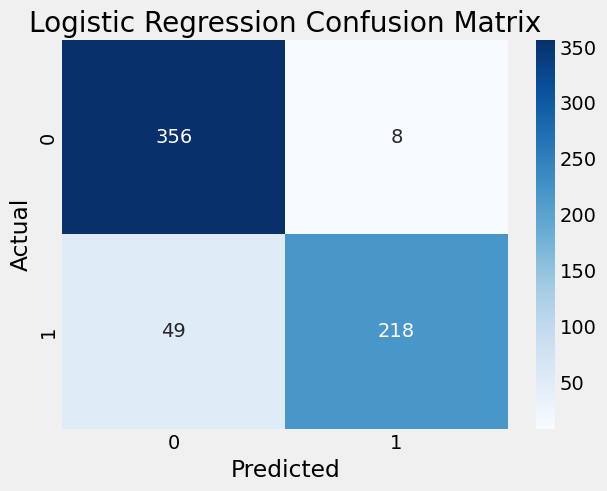

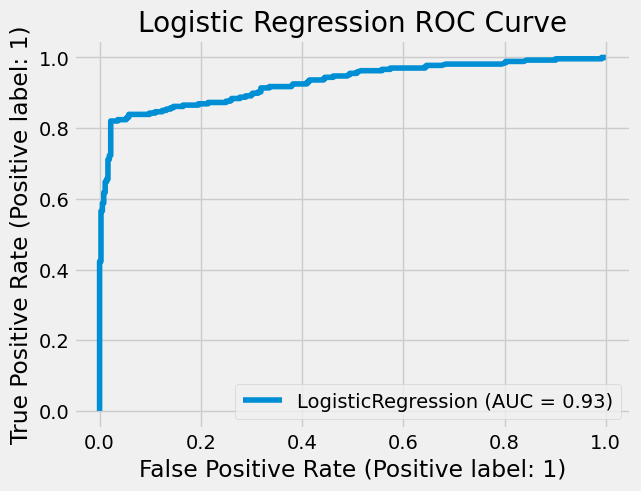

In [ ]:
plot_confusion_matrix(y_test, y_pred, 'Logistic Regression Confusion Matrix')
plot_roc_curve(logreg, X_test, y_test, 'Logistic Regression ROC Curve')

The aim of the logistic regression model above was to come up with a predictor of whether one will or will not purchase an insurance cover based on the fearures given

The model accuracy was a whooping ``0.9096671949286846`` an improvement from the one we created earlier

In [ ]:
from sklearn.model_selection import cross_val_score
# Cross-validation
logreg = LogisticRegression(random_state=1)
cv_scores = cross_val_score(logreg, X, y, cv=5)  # 5-fold cross-validation
cv_mean_score = cv_scores.mean()
cv_std_score = cv_scores.std()

cv_mean_score, cv_std_score

(0.9032953487787087, 0.014981617404214293)

1. Mean Cross-Validation Score (0.9033): This is the average accuracy of your logistic regression model across all the folds in the cross-validation process. An accuracy of approximately 90.33% indicates that the model performs well on average.

2. Standard Deviation of Cross-Validation Scores (0.0150): This value represents the variability or spread of the accuracy scores across the different folds. A standard deviation of 0.0150 suggests that the accuracy scores are quite stable and consistent across the folds. In other words, the model's performance is not highly variable, and you can expect it to perform similarly on different subsets of your data.

Overall, a mean score of around 90% with a low standard deviation indicates that your model is both accurate and reliable.

#### Random Forest

In [ ]:
# Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
rf_pred = rf.predict(X_test)
rf_acc = accuracy_score(y_test, rf_pred)
print(rf_acc)

0.8954041204437401


In [ ]:
from sklearn.metrics import classification_report

target_names = ['Had no Insurance cover' , 'Had an Insurance cover']
print(classification_report(y_test,rf_pred, target_names = target_names  ))

                        precision    recall  f1-score   support

Had no Insurance cover       0.88      0.95      0.91       364
Had an Insurance cover       0.92      0.82      0.87       267

              accuracy                           0.90       631
             macro avg       0.90      0.89      0.89       631
          weighted avg       0.90      0.90      0.89       631



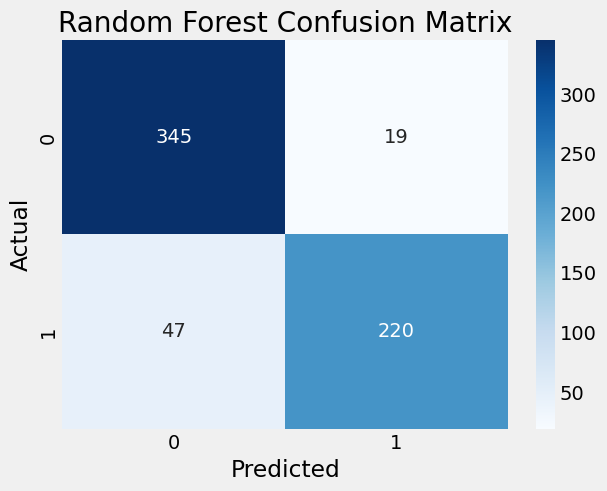

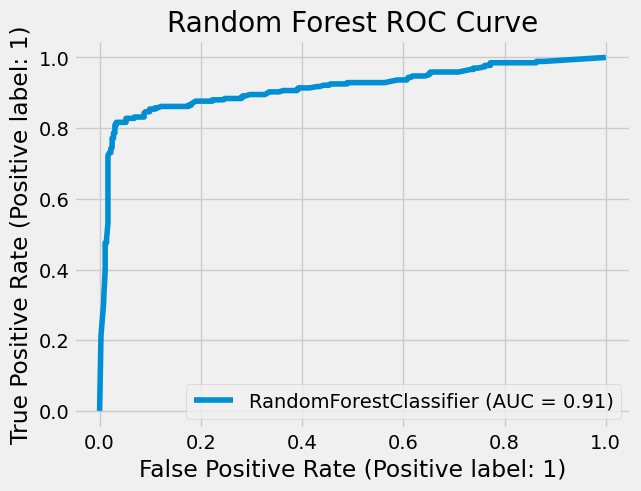

In [ ]:
# Random Forest
plot_confusion_matrix(y_test, rf_pred, 'Random Forest Confusion Matrix')
plot_roc_curve(rf, X_test, y_test, 'Random Forest ROC Curve')

In [ ]:
from sklearn.ensemble import RandomForestClassifier
# Get feature importances
feature_importances = rf.feature_importances_
importance_df = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print(importance_df)


                              Feature  Importance
2         Insurance_During_Last_Visit    0.544877
5                   Last_Visit(Years)    0.124014
1                  Number_of_Children    0.035340
3                     Routine_Checkup    0.033021
25     Monthly_Income_Less than 10000    0.030164
16         Employment_Status_Employed    0.028922
0                      Patient_Gender    0.026423
4                Had_Cancer_Screening    0.022033
6                   Patient_Age_18-30    0.021491
13              Marital_Status_Single    0.016278
12             Marital_Status_Married    0.012664
24              Monthly_Income_50001+    0.012408
20         Monthly_Income_10001-20000    0.012237
17    Employment_Status_Self-employed    0.010161
21         Monthly_Income_20001-30000    0.009852
7                   Patient_Age_31-40    0.009148
19       Employment_Status_Unemployed    0.008948
18          Employment_Status_Student    0.008673
22         Monthly_Income_30001-40000    0.007566


A feature importance of greater than .5 begs an implication that the model could be heavily relying on the feature column to give its accuracy ``(Data  Leakage)``

Domain Knowledge suggests that the feature almost directly correlates to the target column since for one to have an Insurance during the last visit, one has to have had an Insurance cover. But it does not also warrant a direct correlation since one could have had an insurance cover before having visited the hospital but during the last hospital visit, he/she didn't have one due to certain circumstances and vice versa

Thus, further investigations should be made, that is , the `'Insurance_During_Last_Visit'` column should be emmited and the behaviour of the model to be investigated

In [ ]:
rf_cv_scores = cross_val_score(rf, X, y, cv=5)  # 5-fold cross-validation
rf_cv_mean_score = rf_cv_scores.mean()
rf_cv_std_score = rf_cv_scores.std()

rf_cv_mean_score, rf_cv_std_score

(0.8858581742258445, 0.01003510953574736)

1. ``Mean Cross-Validation Score (0.8859)``: The average accuracy of the Random Forest model is approximately 88.59%. This indicates that the Random Forest model performs well, though it's slightly less accurate compared to the logistic regression model (90.33%) and slightly lower than the hypothetical SVM and Random Forest scores given earlier.

2. ``Standard Deviation (0.0100)``: The standard deviation of 0.0100 is quite low, which suggests that the Random Forest model’s performance is very stable across different folds of the cross-validation. The model's accuracy is consistent, with minimal variability, indicating reliable performance.

#### SVM

In [ ]:
# SVM
svm = SVC(kernel='linear', random_state=42)
svm.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [ ]:
svm_pred = svm.predict(X_test)
svm_acc = accuracy_score(y_test, svm_pred)
print(svm_acc)

0.9096671949286846


In [ ]:
from sklearn.metrics import classification_report

target_names = ['Had no Insurance cover' , 'Had an Insurance cover']
print(classification_report(y_test,svm_pred, target_names = target_names  ))

                        precision    recall  f1-score   support

Had no Insurance cover       0.88      0.98      0.93       364
Had an Insurance cover       0.96      0.82      0.88       267

              accuracy                           0.91       631
             macro avg       0.92      0.90      0.91       631
          weighted avg       0.92      0.91      0.91       631



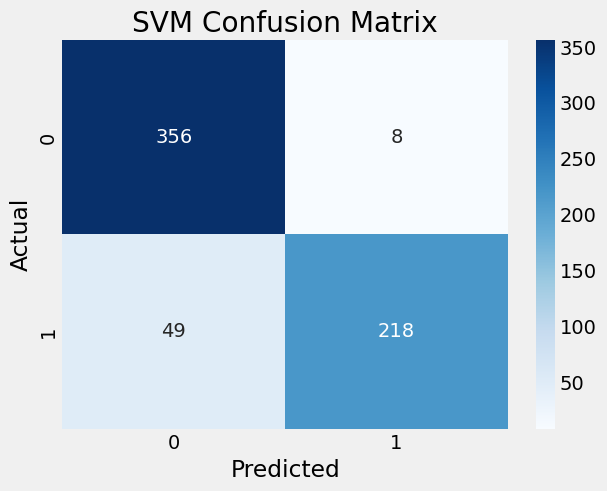

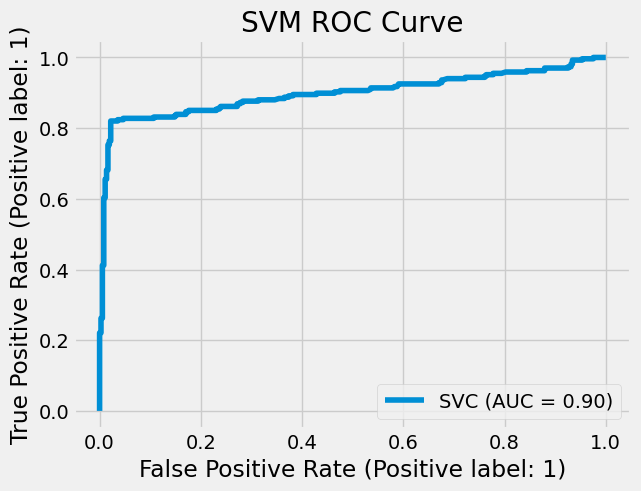

In [ ]:
# SVM
plot_confusion_matrix(y_test, svm_pred, 'SVM Confusion Matrix')
plot_roc_curve(svm, X_test, y_test, 'SVM ROC Curve')

In [ ]:
# Get coefficients
coefficients = svm.coef_[0]
coeff_df = pd.DataFrame({
    'Feature': feature_cols,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', ascending=False)

print(coeff_df)

                              Feature  Coefficient
2         Insurance_During_Last_Visit     0.957260
22         Monthly_Income_30001-40000     0.000035
13              Marital_Status_Single     0.000027
8                   Patient_Age_41-50     0.000023
20         Monthly_Income_10001-20000     0.000020
3                     Routine_Checkup     0.000018
24              Monthly_Income_50001+     0.000013
16         Employment_Status_Employed     0.000012
6                   Patient_Age_18-30     0.000008
1                  Number_of_Children     0.000002
18          Employment_Status_Student     0.000001
15  Employment_Status_(Un-identified)    -0.000001
21         Monthly_Income_20001-30000    -0.000003
19       Employment_Status_Unemployed    -0.000004
4                Had_Cancer_Screening    -0.000005
7                   Patient_Age_31-40    -0.000007
11            Marital_Status_Divorced    -0.000009
17    Employment_Status_Self-employed    -0.000010
5                   Last_Visit(

In [ ]:
# Perform cross-validation
svm_cv_scores = cross_val_score(svm, X, y, cv=5)  # 5-fold cross-validation
svm_cv_mean_score = svm_cv_scores.mean()
svm_cv_std_score = svm_cv_scores.std()

svm_cv_mean_score, svm_cv_std_score

(0.9036123059894852, 0.014861122529251874)

1. ``Mean Score (0.9036)``: The average accuracy of the SVM model is approximately 89.85%. This indicates that the SVM model performs well, though it is slightly less accurate than the logistic regression model in your case.

2. ``Standard Deviation (0.0148)``: The standard deviation is slightly higher compared to the logistic regression model. This suggests that while the SVM model is generally reliable, its performance might vary a bit more across different folds.

In overall terms comparing the models:

1. The ``Logistic Regression model`` has the highest mean accuracy and very low variance, suggesting it’s the most accurate and reliable model in your tests.

2. The ``SVM model`` has a good mean accuracy but with slightly higher variance compared to Random Forest.

3. The ``Random Forest model`` has a very close mean accuracy to SVM but with slightly lower variability, making it a solid choice with reliable performance.

Given these results, the Logistic Regression model seems to be the best performer, followed closely by the Random Forest model. The SVM model is also a strong contender but with a bit more variability in performance.